In [1]:
import SNIDsn
import SNIDdataset as snid
import numpy as np
import SNePCA

import plotly.plotly as ply
import plotly.graph_objs as go
import plotly.tools as tls

import matplotlib.pyplot as plt

from BinSpectra import random_noise_dataset
import warnings
PATH = '../Data/DataProducts/'

In [2]:
def loaddata(phase):
    dsname = "dataset{}.pickle".format(phase)
    return snid.loadPickle(PATH + dsname)


def classify_spectra(ph, dphase=5):
    warnings.filterwarnings('ignore')
    datain = loaddata(phase)
    dataset_randn = random_noise_dataset(datain)
    snidPCA = SNePCA.SNePCA(dataset_randn, ph - dphase, ph+phase)
    snidPCA.snidPCA()
    snidPCA.calcPCACoeffs()
    av_svm_score_dict = {}
    av_svm_std = {}
    f_all, axs = plt.subplots(5,2,figsize=(35,70),gridspec_kw={'wspace':.2,'hspace':.2})
    l = 0
    for i in range(1, 5):
        for j in range(i + 1, 6):
            exclude = ['sn2007uy', 'sn2009er', 'sn2005ek']
            f_all,svmsc,av,std=snidPCA.pcaPlot(i,j,(10,7),alphamean=.5,alphaell=.1,alphasvm=10,purity=True,excludeSNe=exclude,std_rad=1.0,svm=True,count=3,fig=f_all,ax=f_all.axes[l],ncv=50,markOutliers=True)
            leg = f_all.axes[l].get_legend()
            tit = leg.get_title()
            leg.set_title(title=None)
            xmin, xmax = f_all.axes[l].get_xlim()
            ymin, ymax = f_all.axes[l].get_ylim()
            f_all.axes[l].tick_params(axis='both',which='major', length=20,direction='inout',labelsize=35)
            f_all.axes[l].tick_params(axis='both',which='minor', length=10,direction='inout')
            f_all.axes[l].set_ylabel('PC%d'%j, fontsize=50)
            f_all.axes[l].set_xlabel('PC%d'%i, fontsize=50)
            f_all.axes[l].text(xmin + .3,ymax - .5,'SVM Test Score = %.2f $\pm$ %.2f'%(av,std),fontsize=40)
            av_svm_score_dict.setdefault('PC%d vs PC%d'%(i, j), []).append(av)
            av_svm_std.setdefault('PC%d vs PC%d'%(i, j), []).append(std)
            l = l + 1
    return av_svm_score_dict, av_svm_std  

## Accuracy from binomial distribution

## SVM scores for spectra with random noise

({'PC1 vs PC2': [0.1376470588235294],
  'PC1 vs PC3': [0.1623529411764706],
  'PC1 vs PC4': [0.12705882352941178],
  'PC1 vs PC5': [0.19294117647058825],
  'PC2 vs PC3': [0.1623529411764706],
  'PC2 vs PC4': [0.12823529411764706],
  'PC2 vs PC5': [0.17411764705882352],
  'PC3 vs PC4': [0.12941176470588237],
  'PC3 vs PC5': [0.1752941176470588],
  'PC4 vs PC5': [0.17411764705882352]},
 {'PC1 vs PC2': [0.07020484116628561],
  'PC1 vs PC3': [0.07305493974710599],
  'PC1 vs PC4': [0.07190920842322882],
  'PC1 vs PC5': [0.08648459270347815],
  'PC2 vs PC3': [0.08113383364501961],
  'PC2 vs PC4': [0.07596211038756673],
  'PC2 vs PC5': [0.07152321954621489],
  'PC3 vs PC4': [0.062252972025049196],
  'PC3 vs PC5': [0.08684393192452036],
  'PC4 vs PC5': [0.08956642969729073]})

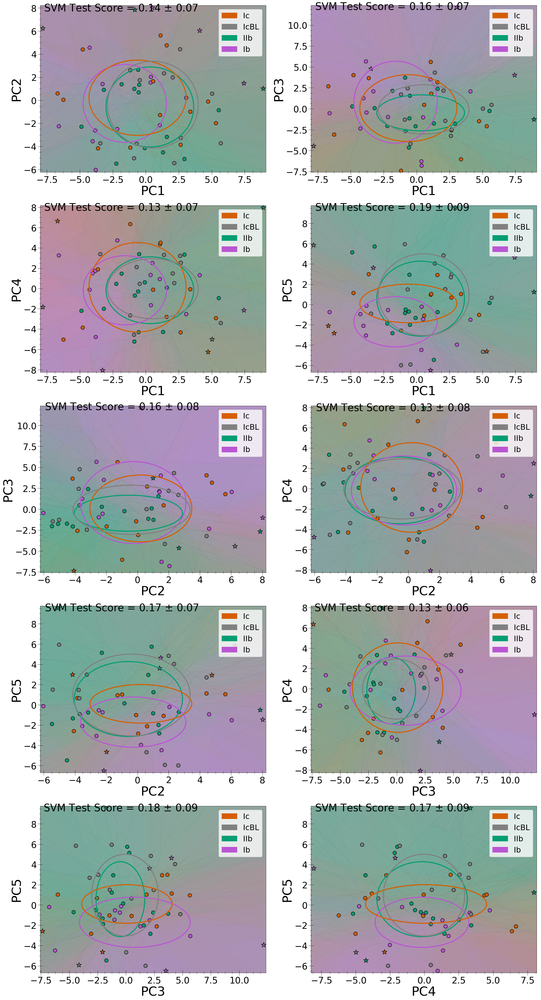

In [3]:
phase = 0
classify_spectra(phase)

({'PC1 vs PC2': [0.16875],
  'PC1 vs PC3': [0.2175],
  'PC1 vs PC4': [0.20875],
  'PC1 vs PC5': [0.22375],
  'PC2 vs PC3': [0.21],
  'PC2 vs PC4': [0.15875],
  'PC2 vs PC5': [0.1825],
  'PC3 vs PC4': [0.18],
  'PC3 vs PC5': [0.20125],
  'PC4 vs PC5': [0.215]},
 {'PC1 vs PC2': [0.08315084184781295],
  'PC1 vs PC3': [0.07729812416870153],
  'PC1 vs PC4': [0.09237322393421159],
  'PC1 vs PC5': [0.07914583059138365],
  'PC2 vs PC3': [0.08728545125048046],
  'PC2 vs PC4': [0.0849724219967867],
  'PC2 vs PC5': [0.06828250141873832],
  'PC3 vs PC4': [0.08895223437328599],
  'PC3 vs PC5': [0.08595965623477098],
  'PC4 vs PC5': [0.09614442261514705]})

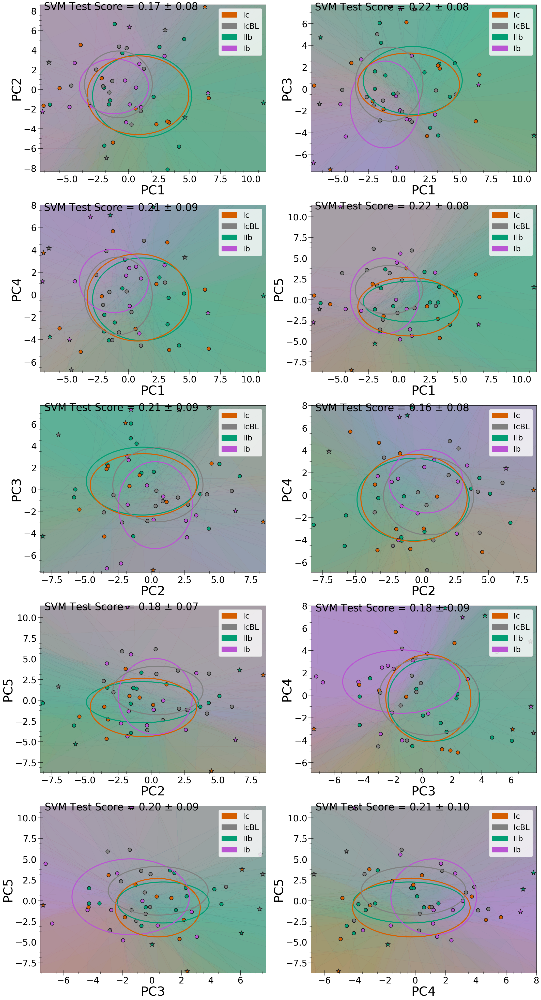

In [4]:
phase = 5
classify_spectra(phase)

({'PC1 vs PC2': [0.21529411764705883],
  'PC1 vs PC3': [0.23294117647058823],
  'PC1 vs PC4': [0.20352941176470588],
  'PC1 vs PC5': [0.20823529411764707],
  'PC2 vs PC3': [0.25529411764705884],
  'PC2 vs PC4': [0.18470588235294116],
  'PC2 vs PC5': [0.19058823529411761],
  'PC3 vs PC4': [0.27882352941176475],
  'PC3 vs PC5': [0.22823529411764706],
  'PC4 vs PC5': [0.24000000000000005]},
 {'PC1 vs PC2': [0.09234357389736662],
  'PC1 vs PC3': [0.0976966564330668],
  'PC1 vs PC4': [0.06881095913359887],
  'PC1 vs PC5': [0.08662051827858806],
  'PC2 vs PC3': [0.09673564734433748],
  'PC2 vs PC4': [0.09189282157731063],
  'PC2 vs PC5': [0.09155330098044105],
  'PC3 vs PC4': [0.09543925041109208],
  'PC3 vs PC5': [0.09458706466937308],
  'PC4 vs PC5': [0.09176470588235294]})

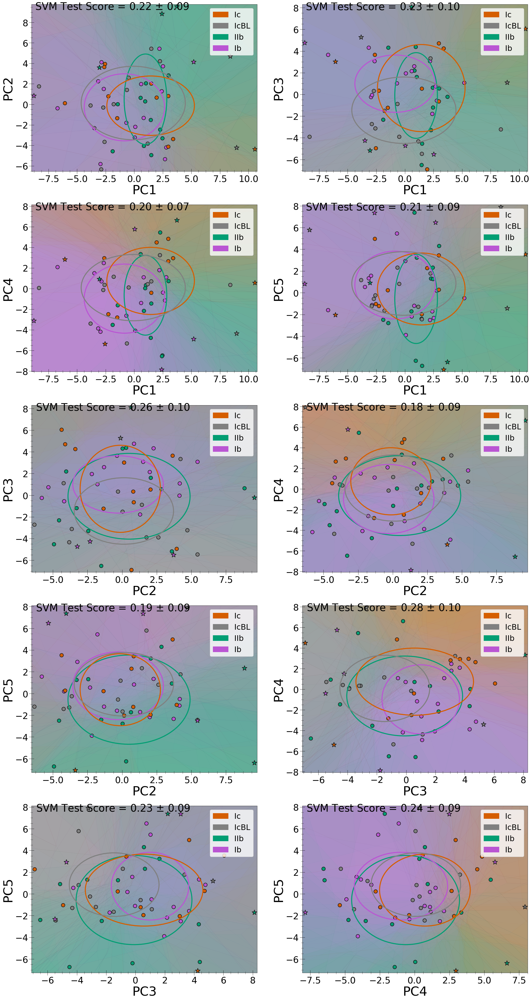

In [5]:
phase = 10
classify_spectra(phase)

({'PC1 vs PC2': [0.17294117647058818],
  'PC1 vs PC3': [0.2364705882352941],
  'PC1 vs PC4': [0.1964705882352941],
  'PC1 vs PC5': [0.2352941176470588],
  'PC2 vs PC3': [0.27058823529411763],
  'PC2 vs PC4': [0.16117647058823528],
  'PC2 vs PC5': [0.2329411764705883],
  'PC3 vs PC4': [0.2388235294117647],
  'PC3 vs PC5': [0.26117647058823534],
  'PC4 vs PC5': [0.19647058823529412]},
 {'PC1 vs PC2': [0.08269676127430575],
  'PC1 vs PC3': [0.10016595226462725],
  'PC1 vs PC4': [0.06292743115442981],
  'PC1 vs PC5': [0.08803899733585745],
  'PC2 vs PC3': [0.09557692240748189],
  'PC2 vs PC4': [0.09022079797664868],
  'PC2 vs PC5': [0.08315575080975196],
  'PC3 vs PC4': [0.10679994556975402],
  'PC3 vs PC5': [0.09048886834366782],
  'PC4 vs PC5': [0.07497173631225797]})

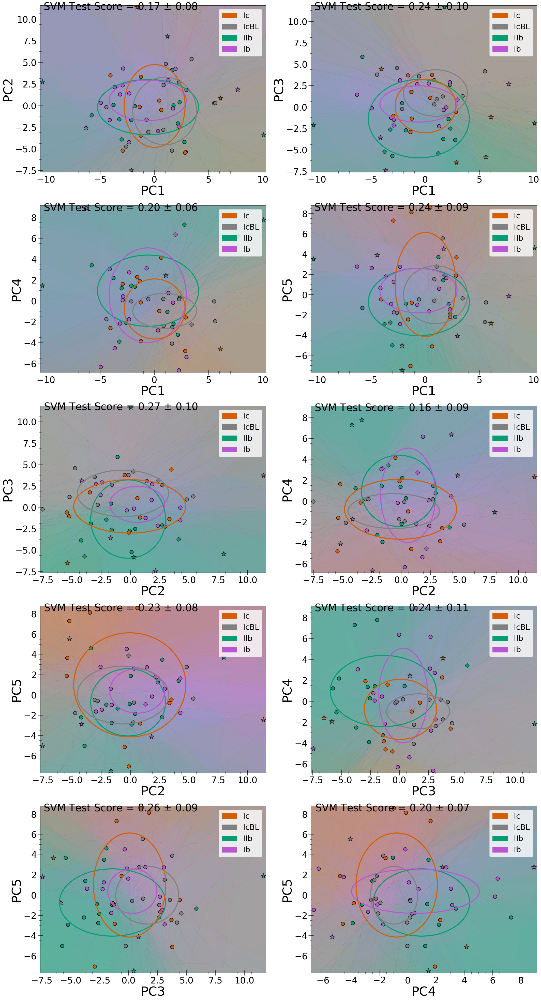

In [6]:
phase = 15
classify_spectra(phase)

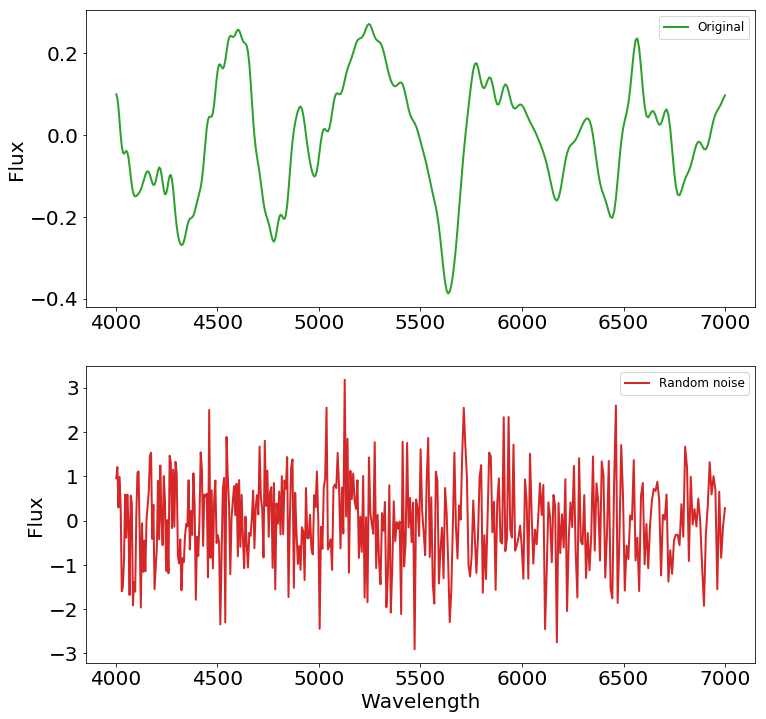

In [8]:
dataset0 = snid.loadPickle('../Data/DataProducts/dataset0.pickle')
dataset5 = snid.loadPickle('../Data/DataProducts/dataset5.pickle')
dataset10 = snid.loadPickle('../Data/DataProducts/dataset10.pickle')
dataset15 = snid.loadPickle('../Data/DataProducts/dataset15.pickle')
dataset0_randn = random_noise_dataset(dataset0)
dataset5_randn = random_noise_dataset(dataset5)
dataset10_randn = random_noise_dataset(dataset10)
dataset15_randn = random_noise_dataset(dataset15)
dataset0 = snid.loadPickle('../Data/DataProducts/dataset0.pickle')
dataset5 = snid.loadPickle('../Data/DataProducts/dataset5.pickle')
dataset10 = snid.loadPickle('../Data/DataProducts/dataset10.pickle')
dataset15 = snid.loadPickle('../Data/DataProducts/dataset15.pickle')
wvl = dataset0["sn1998dt"].wavelengths
flux = dataset0["sn1998dt"].data
uncer = dataset0["sn1998dt"].smooth_uncertainty
wvl_rn = dataset0_randn["sn1998dt"].wavelengths
flux_rn = dataset0_randn["sn1998dt"].data
uncer_rn = dataset0_randn["sn1998dt"].smooth_uncertainty
fig, axs = plt.subplots(2, figsize=(12,12))
#fig.suptitle('Bin length = %.2f'%(wbin), fontsize=20)
axs[0].plot(wvl, flux, 'tab:green', linewidth=2, label = "Original")
axs[1].plot(wvl_rn, flux_rn, 'tab:red', linewidth=2, label = "Random noise")
axs[1].set_xlabel('Wavelength', fontsize=20)
axs[0].set_ylabel('Flux', fontsize='20')
axs[1].set_ylabel('Flux', fontsize='20')
axs[0].tick_params(axis='both', which='major', labelsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)
axs[0].legend(loc="upper right", fontsize = '12')
axs[1].legend(loc="upper right", fontsize = '12')